In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
PIANO_PATH = '/content/drive/MyDrive/cuhk/fyp/jsb/piano_wav'
VIOLIN_PATH = '/content/drive/MyDrive/cuhk/fyp/jsb/violin_wav'

In [ ]:
SAMPLING_RATE = 22050

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import librosa.display

def plot_spec(audio, sampling_rate=SAMPLING_RATE, title='Mel-frequency spectrogram', save=False):
  fig, ax = plt.subplots()
  audio_db = librosa.power_to_db(audio, ref=np.max)
  img = librosa.display.specshow(audio_db, x_axis='time',
                                 y_axis='mel', sr=sampling_rate,
                                 fmax=8000, ax=ax)

  fig.colorbar(img, ax=ax, format='%+2.0f dB')
  ax.set(title=title)

  if save:
    fig.savefig(f'/content/output/{title}.png')

In [ ]:
import librosa

def normalize(spec):
  spec = (spec - 127.5) / 127.5
  return spec

def denormalize(spec):
  spec = spec * 127.5 + 127.5
  return spec

def read_wav(path, duration=5.94, sampling_rate=SAMPLING_RATE):
  audio, sampling_rate = librosa.load(path, duration=duration, sr=sampling_rate)
  spec = librosa.feature.melspectrogram(y=audio, sr=sampling_rate, n_mels=256)
  # Expand dimension so that they fit into the model with channel = 1.
  return np.expand_dims(normalize(spec), axis=2)

In [ ]:
from pathlib import Path
import tensorflow as tf

# Our training set consist of 305 images
BUFFER_SIZE = 305
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256

def load_melspec_pair(filename):
  input_spec = read_wav(path=f'{PIANO_PATH}/{filename}')
  output_spec = read_wav(path=f'{VIOLIN_PATH}/{filename}')
  return input_spec, output_spec

def load_wav_in(dir):
  data = []
  for i, p in enumerate(Path(dir).glob('*.wav')):
    data.append(p)
  return [read_wav(p) for p in data]

def prepare_dataset():
  piano_specs = load_wav_in(PIANO_PATH)
  print(f'{len(piano_specs)} piano wav files loaded.')
  violin_specs = load_wav_in(VIOLIN_PATH)
  print(f'{len(violin_specs)} violin wav files loaded.')

  dataset = tf.data.Dataset.from_tensor_slices((piano_specs, violin_specs))
  # We use the first 10% of data as test set and the remaining as training set.
  test_dataset = dataset.take(len(piano_specs) // 10)
  test_dataset = test_dataset.batch(BATCH_SIZE)
  train_dataset = dataset.skip(len(piano_specs) // 10)
  train_dataset = train_dataset.shuffle(BUFFER_SIZE)
  train_dataset = train_dataset.batch(BATCH_SIZE)
  return train_dataset, test_dataset

train_dataset, test_dataset = prepare_dataset()

305 piano wav files loaded.
305 violin wav files loaded.


Let's look at a pair of spectrograms of the same song:

(256, 256)


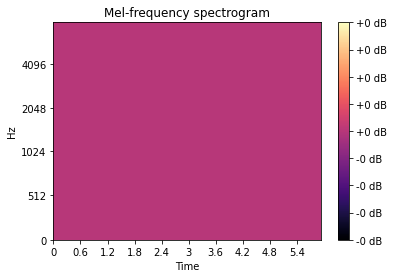

In [ ]:
piano1_melspec = read_wav(PIANO_PATH + '/1.wav', duration=5.94, sampling_rate=SAMPLING_RATE)
piano1_melspec = np.array(piano1_melspec).squeeze()
plot_spec(piano1_melspec, SAMPLING_RATE)
print(piano1_melspec.shape)

In [ ]:
violin1_melspec = read_wav(VIOLIN_PATH + '/1.wav', duration=5, sampling_rate=SAMPLING_RATE)
plot_spec(violin1_melspec, SAMPLING_RATE)

In [ ]:
def recover_from_melspectrogram(melspectrogram):
  stft = librosa.feature.inverse.mel_to_stft(melspectrogram, sr=SAMPLING_RATE)
  audio = librosa.griffinlim(stft)
  return audio

In [ ]:
import IPython

piano1_recovered = recover_from_melspectrogram(piano1_melspec)
IPython.display.Audio(data=piano1_recovered, rate=SAMPLING_RATE)

In [ ]:
violin1_recovered = recover_from_melspectrogram(violin1_melspec)
IPython.display.Audio(data=violin1_recovered, rate=SAMPLING_RATE)

# Training

In [ ]:
OUTPUT_CHANNELS = 1

In [ ]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [ ]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [ ]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256, 1])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

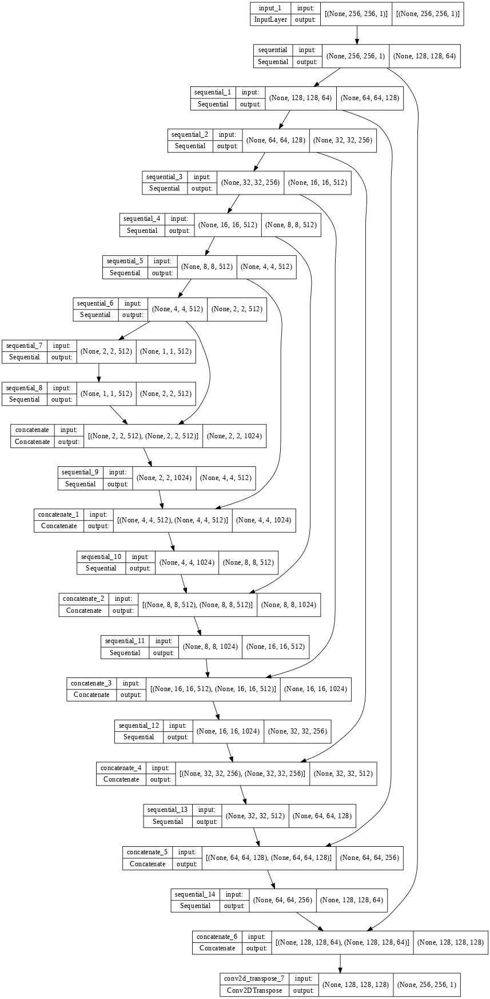

In [ ]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

[[[ 0.00350946]
  [-0.02703012]
  [ 0.01064195]
  ...
  [-0.03464933]
  [ 0.00950762]
  [-0.01565008]]

 [[-0.01153476]
  [ 0.00303484]
  [-0.01623552]
  ...
  [-0.00213636]
  [-0.01436511]
  [ 0.00536783]]

 [[-0.00128125]
  [-0.04648853]
  [-0.00117045]
  ...
  [-0.04814716]
  [-0.00828955]
  [-0.02829127]]

 ...

 [[-0.00934291]
  [ 0.01593004]
  [-0.02082069]
  ...
  [ 0.01662825]
  [-0.0141011 ]
  [ 0.00474295]]

 [[ 0.00343075]
  [-0.04293933]
  [-0.0024471 ]
  ...
  [-0.05474295]
  [-0.00507457]
  [-0.0257899 ]]

 [[-0.00065636]
  [ 0.01416138]
  [-0.00089203]
  ...
  [ 0.01751221]
  [-0.00123301]
  [ 0.01146091]]]


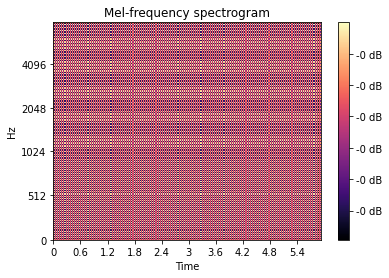

In [ ]:
# Test the generator.
input = read_wav(f'{PIANO_PATH}/1.wav')
output = generator(input[tf.newaxis, ...], training=False)
print(np.array(output[0, ...]))
plot_spec(denormalize(np.array(output[0, ...]).squeeze()))

In [ ]:
LAMBDA = 100

In [ ]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

In [ ]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 1], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 1], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

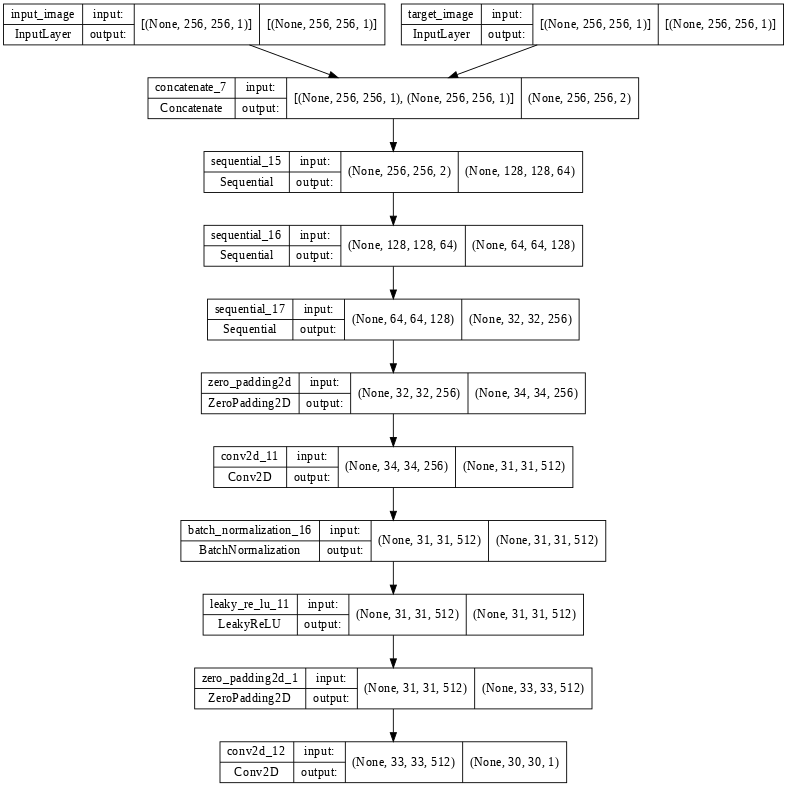

In [ ]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

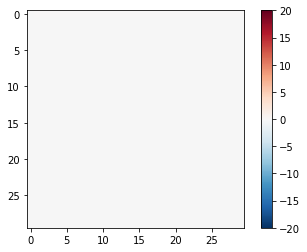

In [ ]:
disc_out = discriminator([input[tf.newaxis, ...], output], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
import os
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [ ]:
def generate_images(model, test_input, tar, epoch):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input, tar, prediction]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  input_spec = denormalize(np.array(display_list[0][0, ...]).squeeze())
  mapped_spec = denormalize(np.array(display_list[1][0, ...]).squeeze())
  gen_spec = denormalize(np.array(display_list[2][0, ...]).squeeze())

  plot_spec(input_spec, title=f'Epoch {epoch} Input', save=True)
  plot_spec(mapped_spec, title=f'Epoch {epoch} Ground Truth', save=True)
  plot_spec(gen_spec, title=f'Epoch {epoch} Prediction', save=True)
  

  return input_spec, mapped_spec, gen_spec

<Figure size 1080x1080 with 0 Axes>

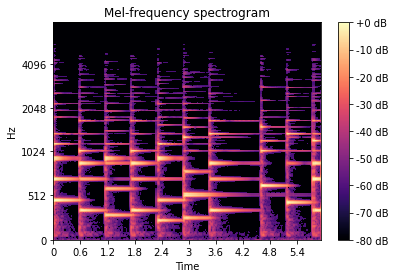

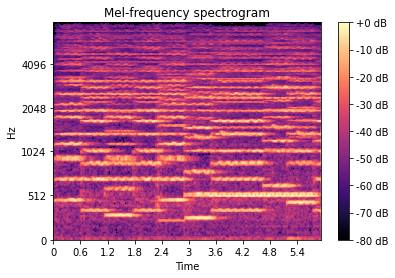

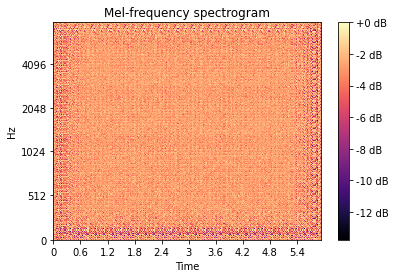

In [ ]:
for example_input, example_target in test_dataset.take(1):
  # print(example_input, example_target)
  generate_images(generator, example_input, example_target, 0)

In [ ]:
import datetime

log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [ ]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

In [ ]:
from IPython import display

def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      generate_images(generator, example_input, example_target, step)
      print(f"Step: {step//1000}k")

    train_step(input_image, target, step)

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)


    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import time
fit(train_dataset, test_dataset, steps=40000)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
!ls {checkpoint_dir}

checkpoint		    ckpt-5.data-00000-of-00001
ckpt-1.data-00000-of-00001  ckpt-5.index
ckpt-1.index		    ckpt-6.data-00000-of-00001
ckpt-2.data-00000-of-00001  ckpt-6.index
ckpt-2.index		    ckpt-7.data-00000-of-00001
ckpt-3.data-00000-of-00001  ckpt-7.index
ckpt-3.index		    ckpt-8.data-00000-of-00001
ckpt-4.data-00000-of-00001  ckpt-8.index
ckpt-4.index


In [ ]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

<Figure size 1080x1080 with 0 Axes>

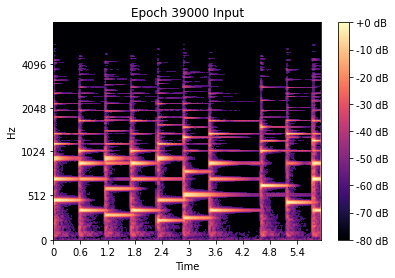

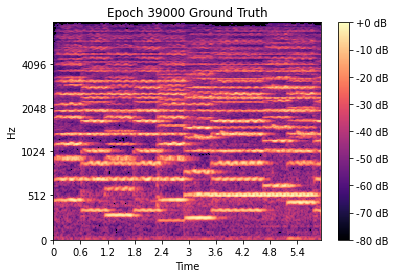

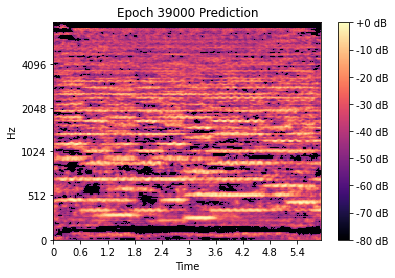

<Figure size 1080x1080 with 0 Axes>

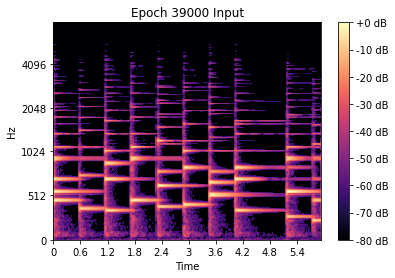

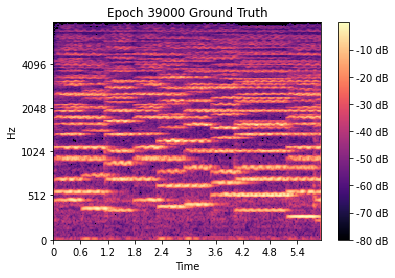

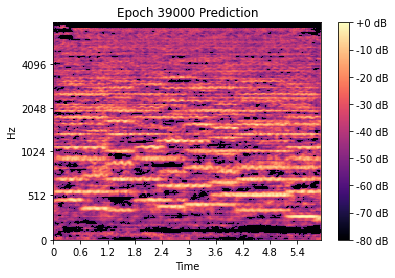

In [ ]:
import IPython
# Run the trained model on a few examples from the test set
for inp, tar in test_dataset.take(2):
  spec = generate_images(generator, inp, tar, 39000)
  recovered = recover_from_melspectrogram(spec[2])
  IPython.display.Audio(data=recovered, rate=SAMPLING_RATE)

In [ ]:
IPython.display.Audio(data=recovered, rate=SAMPLING_RATE)